In [1]:
import numpy as np
from matplotlib import pyplot as plt
import os
import glob
from functions.get_params import get_params

In [2]:
from tools.parametrize.explore import explore
from tools.basic.loadsavejson import loadjson

In [3]:
paths = "final/*/inflation/params.json"
# sort 
paths = sorted(glob.glob(paths))

In [4]:
paths

['final/2024-01-02__17-51-02__14471/inflation/params.json',
 'final/2024-01-03__08-21-01__39189/inflation/params.json',
 'final/2024-01-03__15-29-00__32530/inflation/params.json',
 'final/2024-01-03__16-27-53__19311/inflation/params.json',
 'final/2024-01-03__16-39-40__27209/inflation/params.json',
 'final/2024-01-03__16-51-59__31192/inflation/params.json',
 'final/2024-01-04__08-23-01__70168/inflation/params.json',
 'final/2024-01-05__12-03-56__59010/inflation/params.json',
 'final/2024-01-09__11-44-19__81959/inflation/params.json',
 'final/2024-01-10__07-32-31__99756/inflation/params.json',
 'final/2024-01-11__12-04-21__64913/inflation/params.json',
 'final/2024-01-11__13-39-10__18176/inflation/params.json',
 'final/2024-01-12__08-52-25__53812/inflation/params.json',
 'final/2024-01-12__12-09-07__63832/inflation/params.json',
 'final/2024-01-12__13-56-53__71979/inflation/params.json',
 'final/2024-01-15__08-48-22__22729/inflation/params.json',
 'final/2024-01-15__09-58-37__13640/infl

In [24]:
results = [ loadjson(path) for path in paths ]

[{'elapsed': 621.3870356082916,
  'error': 0,
  'error_msg': 'Correct Execution',
  'verbose': True,
  'pressure': 0,
  'ncpus': 16,
  'attemps': 4,
  'surface_behavior': {'type': 'hard', 'dist': 0.1, 'pressure': 1000},
  'radius_target': 2.0,
  'rho': 0.00097,
  'gmsh_path': 'final/2024-01-02__17-51-02__14471/gmsh',
  'output_folder': 'final/2024-01-02__17-51-02__14471/inflation',
  'init_time': '2024-01-02 17:54:28',
  'r_hebra': 0.135,
  'contacts': array([[ 1,  2],
         [ 1,  3],
         [ 1,  4],
         ...,
         [62, 63],
         [62, 64],
         [63, 64]]),
  'nsets': {'esqueleto_1': array([255, 256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267,
          268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280,
          281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293,
          294, 295, 296, 297, 298, 299, 300, 301, 302, 303, 304, 305, 306,
          307, 308, 309, 310, 311, 312, 313, 314, 315, 316, 317, 318, 319,
          320, 3

In [46]:
results_list = [ result
          for result in results
          if "denier_per_filament" in result.keys() ]

In [55]:
denier = [ result["denier_per_filament"]
            for result in results_list ]

paths  = [ results["output_folder"] for results in results_list ]

angles = []
for r in results_list:
    if "theta" in r.keys():
        angles.append(r["theta"]*180/np.pi)
    else:
        angles.append(-1)

pressure = [ result["pressure"] for result in results_list ]

In [52]:
len(angles)

17

In [56]:
# to dataframe
import pandas as pd
df = pd.DataFrame({"denier": denier,
                    "path": paths, 
                    "angle": angles,
                    "pressure": pressure})

In [57]:
df

,denier,path,angle,pressure
0,393.286537,final/2024-01-02__17-51-02__14471/inflation,-1.0,0
1,392.400782,final/2024-01-03__08-21-01__39189/inflation,-1.0,0
2,391.408721,final/2024-01-03__16-51-59__31192/inflation,-1.0,800
3,392.368645,final/2024-01-04__08-23-01__70168/inflation,-1.0,100
4,392.261747,final/2024-01-05__12-03-56__59010/inflation,65.0,200
5,372.923171,final/2024-01-09__11-44-19__81959/inflation,65.0,200
6,384.001665,final/2024-01-10__07-32-31__99756/inflation,65.0,200
7,383.637309,final/2024-01-11__12-04-21__64913/inflation,65.0,400
8,382.889086,final/2024-01-11__13-39-10__18176/inflation,65.0,800
9,391.408548,final/2024-01-12__08-52-25__53812/inflation,65.0,800


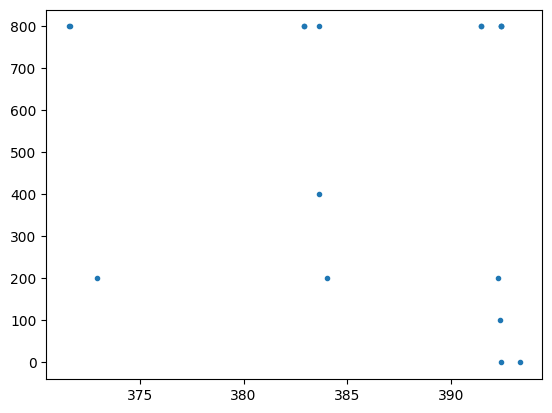

In [58]:
# plot pressure vs denier
plt.figure()
plt.plot(df["denier"], df["pressure"], ".")